In [130]:
import pandas as pd
import numpy as np
import os


## 데이터 설명
1. 요일 0: 토요일, 1: 일요일
2. 배우는 출연한 영화와 방송의 횟수, 수상경력을 대상3, 최우수&우수 2, 기타 1로 카운트
3. CPI(CONTENT POWER INDEX) : 콘텐츠 영향력 지수
4. 미세먼지 : 미세먼지 농도를 나타내고 미세먼지가 강하면 집에 있을 가능성이 높기에 드라마 시청 확률에 영향을 줄 수 있다.
5. 연출자 & 작가 : 이전에 했던 드라마 중 시청률 20%넘은 작품수와 수상경력을 카운트
6. 특이사항 0: 없음, 1: 있음 - 월드컵, 아시안컵, 올림픽, 추석연휴, 설날연휴 등 방송편성시간 변경

In [131]:
# Data
path = os.getcwd()
df = pd.read_csv(path+"/drama.csv")
print("\t============================\n\tDATA shape is {}\n\t============================".format(df.shape))
df.head()

	DATA shape is (784, 14)


,드라마,날짜,회차,요일,배우,CPI,CPI증감률,경제성장률,실업률,미세먼지,연출자,작가,특이사항,시청률
0,넝쿨째 굴러온 당신 (2012.02.25~2012.09.09),2012.02.25,1,0,75,96.436,2.9,0.7,4.2,47,5,10,0,22.3
1,넝쿨째 굴러온 당신 (2012.02.25~2012.09.09),2012.02.26,2,1,75,96.436,2.9,0.7,4.2,47,5,10,0,28.9
2,넝쿨째 굴러온 당신 (2012.02.25~2012.09.09),2012.03.03,3,0,75,96.436,2.9,0.7,3.7,43,5,10,0,25.7
3,넝쿨째 굴러온 당신 (2012.02.25~2012.09.09),2012.03.04,4,1,75,96.436,2.9,0.7,3.7,43,5,10,0,29.9
4,넝쿨째 굴러온 당신 (2012.02.25~2012.09.09),2012.03.10,5,0,75,96.436,2.9,0.7,3.7,43,5,10,0,26.9


### Random Forest를 위해 ['회차','요일','배우','미세먼지','연출자','작가','특이사항','시청률']만 뽑아서 사용한다.

In [132]:
data = df[['회차','요일','배우','미세먼지','연출자','작가','특이사항','시청률']]
data.head()

,회차,요일,배우,미세먼지,연출자,작가,특이사항,시청률
0,1,0,75,47,5,10,0,22.3
1,2,1,75,47,5,10,0,28.9
2,3,0,75,43,5,10,0,25.7
3,4,1,75,43,5,10,0,29.9
4,5,0,75,43,5,10,0,26.9


In [133]:
data.rename(columns={'회차': 'Episode', '요일': 'Day', '배우': 'Actor', '미세먼지': 'Dust',
                     '연출자': 'Director', '작가': 'Author', '특이사항': 'Exception', '시청률': 'Rating'}, inplace=True)

/home/smsm8898/miniconda3/envs/tf/lib/python3.7/site-packages/pandas/core/frame.py:4223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(**kwargs)


In [134]:
data.describe()

,Episode,Day,Actor,Dust,Director,Author,Exception,Rating
count,784.000000,784.000000,784.000000,784.000000,784.000000,784.000000,784.000000,784.000000
mean,26.682398,0.503827,66.491071,42.697704,3.547194,7.492347,0.054847,29.372959
std,15.181655,0.500305,7.719536,13.573101,1.196127,3.350522,0.227827,5.846550
min,1.000000,0.000000,53.000000,19.000000,1.000000,2.000000,0.000000,14.900000
25%,14.000000,0.000000,61.000000,32.000000,3.000000,5.000000,0.000000,25.000000
50%,27.000000,1.000000,65.000000,42.000000,3.000000,6.000000,0.000000,28.375000
75%,40.000000,1.000000,74.000000,49.000000,5.000000,11.000000,0.000000,32.600000
max,58.000000,1.000000,79.000000,91.000000,5.000000,13.000000,1.000000,48.300000


/home/smsm8898/miniconda3/envs/tf/lib/python3.7/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/smsm8898/miniconda3/envs/tf/lib/python3.7/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/smsm8898/miniconda3/envs/tf/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/smsm8898/miniconda3/envs/tf/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


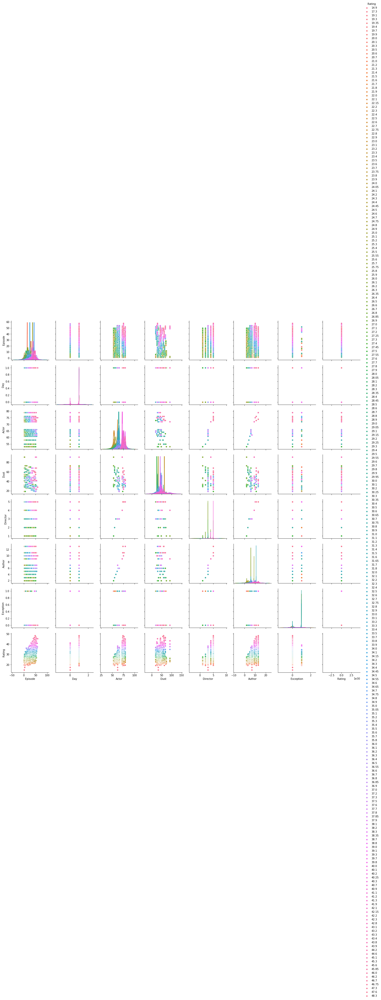

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

temp = data

sns.pairplot(temp, hue='Rating')

# 1. 목표 
### 기존의 15개의 주말 Drama 시청률을 통해 다음 Drama 시청률 예측하기

# 2. 계획
0. 15개의 드라마를 통해 supervised learning을 한다.
1. 먼저 드라마 별로 변수를 나눈다.
2. 선택된 feature를 통해 training을 한다.
3. 75%를 train으로 25%를 test로 사용한다

### 다양한 Regrssion을 이용하여 Model Training하기

In [141]:
# Normalize
data_norm = (data-data.mean())/data.std()
print(data_norm.shape)
data_norm

(784, 8)


,Episode,Day,Actor,Dust,Director,Author,Exception,Rating
0,-1.691673,-1.007040,1.102259,0.316972,1.214592,0.748437,-0.24074,-1.209766
1,-1.625804,0.991743,1.102259,0.316972,1.214592,0.748437,-0.24074,-0.080895
2,-1.559935,-1.007040,1.102259,0.022272,1.214592,0.748437,-0.24074,-0.628227
3,-1.494066,0.991743,1.102259,0.022272,1.214592,0.748437,-0.24074,0.090146
4,-1.428197,-1.007040,1.102259,0.022272,1.214592,0.748437,-0.24074,-0.422978
...,...,...,...,...,...,...,...,...
779,1.535906,0.991743,-0.452239,-1.377556,-0.457471,-0.445407,-0.24074,0.389467
780,1.601775,-1.007040,-0.452239,-1.377556,-0.457471,-0.445407,-0.24074,-0.149312
781,1.667644,0.991743,-0.452239,-1.377556,-0.457471,-0.445407,-0.24074,0.569061
782,1.733513,-1.007040,-0.452239,-1.377556,-0.457471,-0.445407,-0.24074,0.244083


In [142]:
# Train & Test Split
test_size=0.75
row_size = int(df.shape[0]*test_size)

X_train, y_train, X_test, y_test = data_norm.iloc[:row_size,:-1], data_norm.iloc[:row_size,-1:],data_norm.iloc[row_size:,:-1],data_norm.iloc[row_size:,-1:]

In [143]:
result = list()

# 다양한 model에 Data를 학습하여 비교해보기

### LinearRegression

In [150]:
from sklearn.linear_model import LinearRegression
from sklearn import metrics

model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
result.append(metrics.mean_absolute_error(y_test, y_pred))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 0.32655062633300797
Mean Squared Error: 0.15387402110637707
Root Mean Squared Error: 0.3922677925937548


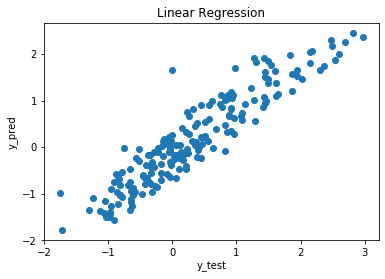

In [145]:
plt.scatter(y_test, y_pred)
plt.xlabel("y_test")
plt.ylabel("y_pred")
plt.title("Linear Regression")
plt.show()

### RandomForest

In [151]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(n_estimators=20, random_state=0)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Extract single tree
estimator = model.estimators_[5]
result.append(metrics.mean_absolute_error(y_test, y_pred))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 0.3545436725899845
Mean Squared Error: 0.21985786852748648
Root Mean Squared Error: 0.46889003884438246


/home/smsm8898/miniconda3/envs/tf/lib/python3.7/site-packages/ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


In [92]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = X_train.columns,
                class_names = y_train.columns,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

### XGBoost

In [152]:
from xgboost import XGBRegressor 

model = XGBRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
result.append(metrics.mean_absolute_error(y_test, y_pred))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

[05:18:47] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1566327313563/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Mean Absolute Error: 0.3269491955130694
Mean Squared Error: 0.1845605864981805
Root Mean Squared Error: 0.42960515185246617


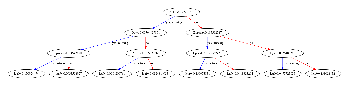

In [94]:
# plot decision tree
from numpy import loadtxt
from xgboost import plot_tree

# plot single tree
plot_tree(model)
plt.show()

### LightGBM

In [153]:
from lightgbm import LGBMRegressor

model = LGBMRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
result.append(metrics.mean_absolute_error(y_test, y_pred))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 0.3378780515440205
Mean Squared Error: 0.19623439190340664
Root Mean Squared Error: 0.44298351199949487


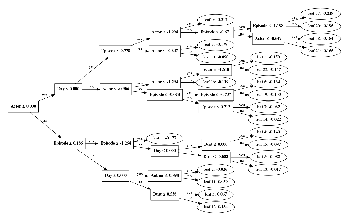

In [96]:
from lightgbm import plot_tree

# plot single tree
plot_tree(model)
plt.show()

In [149]:
result

[0.32655062633300797]

In [155]:
print("Linear Regression's mean_absolute_error is",result[0])
print("Random Forest's mean_absolute_error is",result[1])
print("XGBoost's mean_absolute_error is",result[2])
print("LightGMB's mean_absolute_error is",result[3])
print("\nTherefore LR is the best model to predict audience rating")

Linear Regression's mean_absolute_error is 0.32655062633300797
Random Forest's mean_absolute_error is 0.32655062633300797
XGBoost's mean_absolute_error is 0.3545436725899845
LightGMB's mean_absolute_error is 0.3269491955130694

Therefore LR is the best model to predict audience rating


- Linear Regressio이 가장 성능이 좋을 것으로 판단
- 따라서 어떤 feature가 시청률 예측에 강한 상관관계를 갖는다.
- 이를 위해 corr을 구함

In [127]:
# 상관관계
corr = data_norm.corr(method = 'pearson')
print("Correlation with rating")
corr.iloc[:-1,-1].sort_values()

# Actor, Author, Director, Episode가 강한 상관관계를 나타냄

Correlation with rating


Exception   -0.116484
Dust         0.133703
Day          0.392164
Episode      0.544467
Director     0.547712
Author       0.553627
Actor        0.570007
Name: Rating, dtype: float64

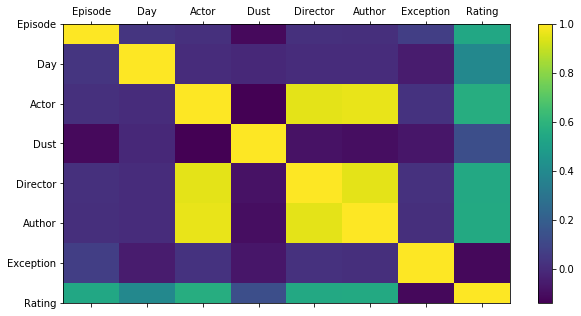

In [126]:
plt.figure(figsize=(10,5))
plt.matshow(data.corr(), fignum=1, aspect='auto')

# plt.matshow(data.corr())
plt.xticks(range(len(data.columns)), data.columns)
plt.yticks(range(len(data.columns)), data.columns)
plt.colorbar()
plt.show()